# Spatio-temporal clustering

In [267]:
# le classique imports
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import geopandas
import geoplot
from shapely.geometry import Polygon, Point
import numpy as np
from scipy import stats
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import geoplot.crs as gcrs
import matplotlib as mpl
import matplotlib.colors as colors
import random

pd.set_option('mode.chained_assignment', None)

# Definitions
## Paths and variables

In [2]:
path = 'C:/Users/Zaca/Documents/Datasets/nyc/'

## Plotting functions

In [351]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100, reverse=False):
   
    if reverse:
        new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(maxval, minval, n))) 
        
        arr = np.linspace(0, 50, 100).reshape((10, 10))
        fig, ax = plt.subplots(ncols=2)
        ax[0].imshow(arr, interpolation='nearest', cmap=cmap)
        ax[1].imshow(arr, interpolation='nearest', cmap=new_cmap)
        plt.show()
                
        return new_cmap
   
    else:
        new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
        
        arr = np.linspace(0, 50, 100).reshape((10, 10))
        fig, ax = plt.subplots(ncols=2)
        ax[0].imshow(arr, interpolation='nearest', cmap=cmap)
        ax[1].imshow(arr, interpolation='nearest', cmap=new_cmap)
        plt.show()
        
        return new_cmap
    
def default_plot(ax, spines): 
    
    ax = plt.gca()
    # Remove unnecessary axes and ticks (top and bottom)
    ax.spines["top"].set_visible(False)   
    ax.spines["right"].set_visible(False)
    ax.get_xaxis().tick_bottom()  
    ax.get_yaxis().tick_left()
    
    # Set the ticks facing OUTWARD
    ax.get_yaxis().set_tick_params(direction='out')
    ax.get_xaxis().set_tick_params(direction='out')
    
    # Remove grid
    #ax.grid('off')
    
    for loc, spine in ax.spines.items():
        if loc in spines:
            spine.set_position(('outward', 10))  # outward by 10 points

    # turn off ticks where there is no spine
    if 'left' in spines:
        ax.yaxis.set_ticks_position('left')
        
    if 'right' in spines:
        ax.yaxis.set_ticks_position('right')

    if 'bottom' in spines:
        ax.xaxis.set_ticks_position('bottom')

    return ax
    
def get_colors(cmap, n):
    cmap = mpl.cm.get_cmap(cmap)
    rgba = [cmap(x) for x in np.linspace(0.01, 0.99, n)]
    sns.palplot(sns.color_palette(rgba));    
    return rgba

def get_single_color(cmap, n):
    cmap = mpl.cm.get_cmap(cmap)
    rgba = cmap(n)
    return rgba

def precinct_selected(precinct, basemap):  
    basemap['selected'] = np.where(basemap.precinct == precinct, 1, 0)   
    ax = geoplot.choropleth(basemap, hue='selected', figsize=(8, 8), lw= 1, edgecolor='k', alpha=1, cmap=new_cmap, projection=gcrs.AlbersEqualArea())
    #geoplot.polyplot(basemap[basemap.precinct == precinct], lw=1, facecolor= get_single_color(new_cmap, .99), edgecolor='k', alpha=1)
    ax.set_title(str(precinct))
    
def view_clusters(basemap, labeled_data):
    ax = geoplot.polyplot(basemap[basemap.precinct == labeled_data.precinct.values[0]], figsize=(8, 8), lw= 2, facecolor= 'None', edgecolor='k', alpha=1)  
    for i in range(len(labeled_data.labels.unique())):
        ax.scatter(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], color=cluster_colors[i], alpha=.75, s=100)
        
def temporal_distribution(labeled_data):   
    fig, ax = plt.subplots(figsize=(6,4))
    ax = default_plot(ax, ['left', 'bottom'])
    plt.xlabel('Time of Day')
    plt.ylabel('Density')
    plt.xlim(0, 24)
    
    min_time = []
    max_time = []
    
    for i in range(len(labeled_data.labels.unique())):
        sns.kdeplot(labeled_data[labeled_data.labels == i].time, bw=1.5, color=cluster_colors[i], label=str(i+1), lw=3)
        
        min_calc = np.quantile(labeled_data[labeled_data.labels == i].time, .5) - 6
        max_calc = np.quantile(labeled_data[labeled_data.labels == i].time, .5) + 6
        
        if min_calc < 0:
            min_calc = 24 + min_calc
        
        if max_calc > 24:
            max_calc = max_calc - 24
            
        min_time += [min_calc]
        max_time += [max_calc]
        
        print('Cluster ' + str(i) + ' schedule:', min_calc, max_calc)
    
    return list(zip(min_time, max_time))

## Algorithm functions

In [312]:
def random_points_within(poly, num_points):
  
    # get exterior limits of the polygon
    min_x, min_y, max_x, max_y = poly.bounds

    points = []
    
    # loop until n points is reached
    while len(points) < num_points:
        random_point = Point([random.uniform(min_x, max_x), random.uniform(min_y, max_y)])
        
        # if point inside polygon
        if (random_point.within(poly)):
            points.append(random_point)

    return points

def random_clusters(basemap, precinct, size):
    rps = random_points_within(basemap[basemap.precinct == precinct]['geometry'].unary_union, size)
    longs = [p.x for p in rps]
    lats = [p.y for p in rps]
    times = np.random.uniform(0, 24, size)
    training = pd.DataFrame({'latitude':lats, 'longitude':longs, 'time':times, 'precinct':[precinct]*size})
    return training

def make_contour(longitude, latitude, precinct_polygon, colors, levels):
    
    x = longitude
    y = latitude
    
    # check bounds
    xmin = precinct_polygon.bounds['minx'].values - 0.0025
    xmax = precinct_polygon.bounds['maxx'].values + 0.0025
    ymin = precinct_polygon.bounds['miny'].values - 0.0025
    ymax = precinct_polygon.bounds['maxy'].values + 0.0025
    
    # Create meshgrid
    xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    
    positions = np.vstack([xx.ravel(), yy.ravel()])
    values = np.vstack([x, y])
    kernel = stats.gaussian_kde(values)
    f = np.reshape(kernel(positions).T, xx.shape)
    cset = plt.contour(xx, yy, f, colors=colors, levels=levels, linewidths=1.5)
    
    return cset


def get_level(contour, n):
    
    # the n gives you the level
    # just remember that its backwards
    # the outermost level is 0
    
    x = []
    y = []
    for j in range(len(contour.allsegs)):
        for ii, seg in enumerate(contour.allsegs[j]):
            x += [seg[:,0]]
            y += [seg[:,1]]
    
    return list(zip(x[n], y[n]))  


def get_view_contours(basemap, labeled_data, precinct, levels):
    
    fig, ax = plt.subplots()
    plt.ylabel('Latitude')
    plt.xlabel('Longitude')
    contours = []
    for i in range(len(labeled_data.labels.unique())):
        ctr = make_contour(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], basemap[basemap.precinct == labeled_data.precinct.values[0]]['geometry'], colors=cluster_colors[i], levels=levels)
        contours += [ctr]

    levels = [get_level(x, 0) for x in contours]

    ax = geoplot.polyplot(basemap[basemap.precinct == labeled_data.precinct.values[0]], figsize=(8, 8), lw= 2, facecolor= 'None', edgecolor='k', alpha=1)
    for i in range(len(labeled_data.labels.unique())):
        ax.scatter(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], color=cluster_colors[i], alpha=.5, s=100)
        ax.plot([x[0] for x in levels[i]], [x[1] for x in levels[i]], color=cluster_colors[i], lw=3)
        
    return levels


def make_clusters(data, n):
    
    data = data[['latitude', 'longitude', 'time']]
    stdscaler = StandardScaler()
    features = stdscaler.fit_transform(data)
    cluster = KMeans(n)
    #cluster = AgglomerativeClustering(n)
    model = cluster.fit(features)
    
    # re-label so that cluster 0 is always the largest and so on.
    data['labels'] = model.labels_
    re_labeling = data.labels.value_counts().reset_index()['index']
    data['new_labels'] = data['labels'].replace(list(re_labeling.values), list(re_labeling.index))
    
    print('Cluster sizes:')
    print(data.new_labels.value_counts())
    
    return data.new_labels.values


def main(ds, training_period, precinct, n_clusters, testing_period, n_levels=3):
    
    subselection = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
    subselection['labels'] = make_clusters(subselection, n_clusters)
    precinct_selected(precinct, clean_map)
    view_clusters(clean_map, subselection)
    time_windows = temporal_distribution(subselection)
    contours = get_view_contours(clean_map, subselection, precinct=precinct, levels=n_levels)
    
    zones = [Polygon(x) for x in contours]
    start_time = [x[0] for x in time_windows]
    end_time = [x[1] for x in time_windows]
    
    test_selection = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
    test_points = [Point(x, y) for x, y in list(zip(test_selection.longitude, test_selection.latitude))]
    test_times = list(test_selection.time.values)
    
    landed = 0
    for c in range(n_clusters):
        for t in range(len(test_points)):
            if (test_points[t].within(zones[c])) and (start_time[c] <= test_times[t] <= end_time[c]):
                landed += 1
    
    print('Target crimes:', len(test_points))            
    if len(test_points) > 0:         
        score = landed/len(test_points)
    else:
        score = -1
    print('Precinct:', precinct)
    print('Events located:', score*100)
    
    return score


def random_main(ds, training_period, precinct, n_clusters, testing_period, n_levels=3):
    
    subselection = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
    simulated = random_clusters(clean_map, precinct, size=subselection.shape[0])
    simulated['labels'] = make_clusters(simulated, n_clusters)
    precinct_selected(precinct, clean_map)
    view_clusters(clean_map, simulated)
    time_windows = temporal_distribution(simulated)
    contours = get_view_contours(clean_map, simulated, precinct=precinct, levels=n_levels)
    
    zones = [Polygon(x) for x in contours]
    start_time = [x[0] for x in time_windows]
    end_time = [x[1] for x in time_windows]
    
    test_selection = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
    test_points = [Point(x, y) for x, y in list(zip(test_selection.longitude, test_selection.latitude))]
    test_times = list(test_selection.time.values)
    
    landed = 0
    for c in range(n_clusters):
        for t in range(len(test_points)):
            if (test_points[t].within(zones[c])) and (start_time[c] <= test_times[t] <= end_time[c]):
                landed += 1
    
    print('Target crimes:', len(test_points))            
    if len(test_points) > 0:         
        score = landed/len(test_points)
    else:
        score = -1
    print('Precinct:', precinct)
    print('Events located:', score*100)
    
    return score

# Choosing colors

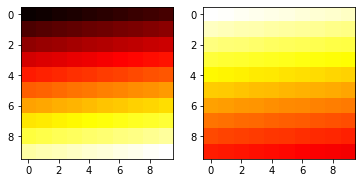

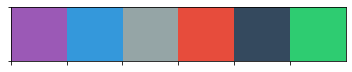

In [6]:
cmap = plt.get_cmap('hot')
new_cmap = truncate_colormap(cmap, 0.35, 1, reverse=True)

#cluster_colors = get_colors(cmap='cool_r', n=4)
#cluster_colors = ["#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
cluster_colors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
sns.palplot(sns.color_palette(cluster_colors));

# Preparing base maps

In [160]:
# open shapefile
pcints = geopandas.read_file(path + 'nypd_precincts.shp').to_crs(epsg=4326)

# clean a variable dtypes
pcints['pct'] = pcints['pct'].astype('int32')

# create a new, clean GeoDataFrame
clean_map = geopandas.GeoDataFrame()
clean_map['precinct'] = pcints['pct'].unique()
clean_map['geometry'] = [Polygon(max(pcints.loc[pcints['pct'] == pct, 'geometry'].unary_union, key=lambda a: a.area).exterior) if pcints.loc[pcints['pct'] == pct, 'geometry'].unary_union.geom_type == 'MultiPolygon' else Polygon(pcints.loc[pcints['pct'] == pct, 'geometry'].unary_union.exterior) for pct in clean_map.precinct]

# Read pre-processed data

In [8]:
# open data
crime = pd.read_csv(path + 'nypd_historic_07-18.csv', index_col=0)
# transform to datetime
crime['date'] = pd.to_datetime(crime['date'])

C:\Users\Zaca\Anaconda3\lib\site-packages\numpy\lib\arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


# Filter by crime

In [225]:
violent = ['FELONY ASSAULT', 'ROBBERY']
propert = ['BURGLARY', 'ARSON', 'GRAND LARCENY', 'GRAND LARCENY OF MOTOR VEHICLE']
popular_sites = ['RESID', 'STREET']
crime_filter = violent + propert
crime_subset = crime[crime.description.isin(crime_filter)]

In [111]:
#crime_subset[crime_subset.description == 'BURGLARY'].premises.value_counts()[:30]

# Select crime type

In [357]:
ds = crime_subset[(crime_subset.description == propert[0])]# & (crime_subset.premises.str.contains(popular_sites[0]))]

# look at number of crime per precinct for exploration
highest_ = ds.groupby('precinct').agg(count=('date', 'count')).sort_values(by='count', ascending=False)

# Select algorithm parameters

In [417]:
precinct = 109
training_period = ['2016-04-01', '2017-04-01']
testing_period = ['2017-04-01', '2017-05-01']
n_clusters = 3
n_levels = 3 # how restrictive are the clusters

training = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
test = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
test_points = [Point(x, y) for x, y in list(zip(test.longitude, test.latitude))]
test_times = list(test.time.values)

# Debugging section

Cluster sizes:
0    112
1    102
2     84
Name: new_labels, dtype: int64
Cluster 0 schedule: 23.0 11.0
Cluster 1 schedule: 12.0 24.0
Cluster 2 schedule: 9.0 21.0
Precinct: 109
# Target crimes: 21
Events located: 80.95238095238095


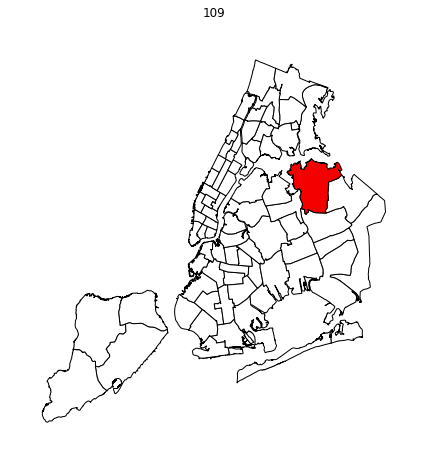

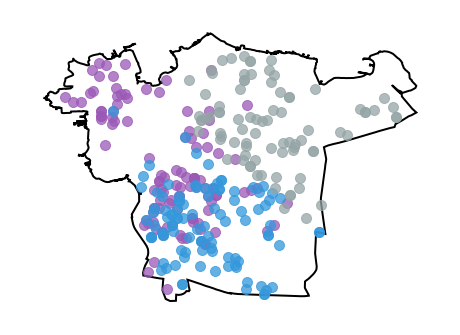

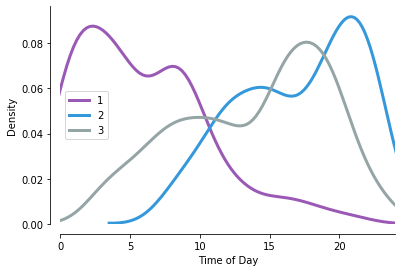

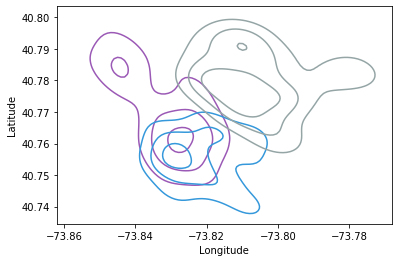

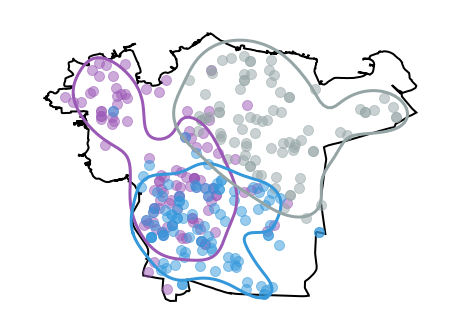

In [418]:
training = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
# define and select clustering algorithm
training['labels'] = make_clusters(training, n_clusters)

# showing selected area
precinct_selected(precinct, clean_map)

# view clusters identified by training
view_clusters(clean_map, training)

# temporal distribution of clusters
time_windows = temporal_distribution(training)

# estimate kernel density and grab contours
contours = get_view_contours(clean_map, training, precinct, levels=n_levels)

# define clusters
zones = [Polygon(x) for x in contours]
start_time = [x[0] for x in time_windows]
end_time = [x[1] for x in time_windows]

landed = 0
for c in range(n_clusters):
    for t in range(len(test_points)):
        if (test_points[t].within(zones[c])) and (start_time[c] <= test_times[t] <= end_time[c]):
            landed += 1
                
if len(test_points) > 0:         
    score = landed/len(test_points)
else:
    score = -1

print('Precinct:', precinct)
print('# Target crimes:', len(test_points))
print('Events located:', score*100)

# For every precinct

In [419]:
# get list of precincts
precincts = list(highest_.index[:30])

In [420]:
precincts

[75,
 83,
 105,
 109,
 114,
 67,
 52,
 47,
 104,
 90,
 79,
 14,
 43,
 113,
 70,
 115,
 61,
 66,
 49,
 110,
 44,
 106,
 102,
 62,
 77,
 120,
 81,
 19,
 103,
 73]

Cluster sizes:
0    141
1    132
2     94
Name: new_labels, dtype: int64
Cluster 0 schedule: 12.0 24.0
Cluster 1 schedule: 4.0 16.0
Cluster 2 schedule: 3.0 15.0
Target crimes: 39
Precinct: 75
Events located: 82.05128205128204
Cluster sizes:
0    135
1    112
2     92
Name: new_labels, dtype: int64
Cluster 0 schedule: 1.0 13.0
Cluster 1 schedule: 10.0 22.0
Cluster 2 schedule: 9.5 21.5
Target crimes: 27
Precinct: 83
Events located: 88.88888888888889
Cluster sizes:
0    125
1     96
2     80
Name: new_labels, dtype: int64
Cluster 0 schedule: 10.0 22.0
Cluster 1 schedule: 0.5 12.5
Cluster 2 schedule: 8.5 20.5
Target crimes: 31
Precinct: 105
Events located: 96.7741935483871
Cluster sizes:
0    114
1    100
2     84
Name: new_labels, dtype: int64
Cluster 0 schedule: 23.0 11.0
Cluster 1 schedule: 12.0 24.0
Cluster 2 schedule: 9.0 21.0
Target crimes: 21
Precinct: 109
Events located: 80.95238095238095
Cluster sizes:
0    85
1    76
2    65
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 12.0 24.0
Cluster 1 schedule: 22.0 10.0
Cluster 2 schedule: 8.0 20.0


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, se

Target crimes: 19
Precinct: 114
Events located: 63.1578947368421
Cluster sizes:
0    108
2     69
1     69
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 5.5 17.5
Cluster 1 schedule: 12.0 24.0
Cluster 2 schedule: 2.0 14.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 13
Precinct: 67
Events located: 84.61538461538461
Cluster sizes:
0    84
1    83
2    66
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4.0 16.0
Cluster 1 schedule: 1.0 13.0
Cluster 2 schedule: 11.0 23.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 8
Precinct: 52
Events located: 87.5
Cluster sizes:
0    118
2     97
1     97
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 5.5 17.5
Cluster 1 schedule: 6.0 18.0
Cluster 2 schedule: 7.0 19.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 37
Precinct: 47
Events located: 40.54054054054054
Cluster sizes:
0    146
1     92
2     88
Name: new_labels, dtype: int64
Cluster 0 schedule: 9.0 21.0


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 1 schedule: 8.0 20.0
Cluster 2 schedule: 2.0 14.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 11
Precinct: 104
Events located: 90.9090909090909
Cluster sizes:
0    88
1    87
2    73
Name: new_labels, dtype: int64
Cluster 0 schedule: 12.0 24.0
Cluster 1 schedule: 9.0 21.0
Cluster 2 schedule: 22.0 10.0


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, se

Target crimes: 16
Precinct: 90
Events located: 50.0
Cluster sizes:
0    115
1    109
2     90
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 10.0 22.0
Cluster 1 schedule: 9.0 21.0
Cluster 2 schedule: 21.0 9.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 24
Precinct: 79
Events located: 45.83333333333333
Cluster sizes:
0    100
1     73
2     53
Name: new_labels, dtype: int64
Cluster 0 schedule: 7.0 19.0
Cluster 1 schedule: 12.0 24.0
Cluster 2 schedule: 0.0 12.0


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 11
Precinct: 14
Events located: 45.45454545454545
Cluster sizes:
0    106
1    104
2     65
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 0 schedule: 0.0 12.0
Cluster 1 schedule: 12.0 24.0
Cluster 2 schedule: 6.0 18.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 13
Precinct: 43
Events located: 30.76923076923077
Cluster sizes:
0    64
1    61
2    56
Name: new_labels, dtype: int64
Cluster 0 schedule: 2.0 14.0
Cluster 1 schedule: 7.0 19.0
Cluster 2 schedule: 12.0 24.0
Target crimes: 7
Precinct: 113
Events located: 71.42857142857143


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Cluster sizes:
0    63
1    59
2    53
Name: new_labels, dtype: int64
Cluster 0 schedule: 6.0 18.0
Cluster 1 schedule: 12.0 24.0
Cluster 2 schedule: 1.0 13.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 6
Precinct: 70
Events located: 50.0
Cluster sizes:
0    139
1     92
2     43
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 6.0 18.0
Cluster 1 schedule: 6.0 18.0
Cluster 2 schedule: 6.0 18.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 26
Precinct: 115
Events located: 42.30769230769231
Cluster sizes:
0    82
1    57
2    54
Name: new_labels, dtype: int64
Cluster 0 schedule: 11.0 23.0
Cluster 1 schedule: 5.0 17.0
Cluster 2 schedule: 1.0 13.0


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 7
Precinct: 61
Events located: 85.71428571428571
Cluster sizes:
0    75
1    49
2    41
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 0 schedule: 1.0 13.0
Cluster 1 schedule: 10.0 22.0
Cluster 2 schedule: 6.0 18.0
Target crimes: 15
Precinct: 66
Events located: 46.666666666666664


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Cluster sizes:
0    67
1    66
2    47
Name: new_labels, dtype: int64
Cluster 0 schedule: 14.0 2.0
Cluster 1 schedule: 23.5 11.5
Cluster 2 schedule: 5.0 17.0


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 14
Precinct: 49
Events located: 28.57142857142857
Cluster sizes:
0    109
1     75
2     63
Name: new_labels, dtype: int64
Cluster 0 schedule: 6.0 18.0
Cluster 1 schedule: 13.0 1.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 2 schedule: 2.0 14.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 21
Precinct: 110
Events located: 52.38095238095239
Cluster sizes:
0    83
1    79
2    58
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 6.0 18.0
Cluster 1 schedule: 10.0 22.0
Cluster 2 schedule: 22.0 10.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 23
Precinct: 44
Events located: 47.82608695652174
Cluster sizes:
1    74
0    74
2    70
Name: new_labels, dtype: int64
Cluster 0 schedule: 1.5 13.5
Cluster 1 schedule: 4.5 16.5


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Cluster 2 schedule: 13.0 1.0
Target crimes: 18
Precinct: 106
Events located: 38.88888888888889
Cluster sizes:
0    61
1    58
2    46
Name: new_labels, dtype: int64
Cluster 0 schedule: 21.0 9.0
Cluster 1 schedule: 10.0 22.0
Cluster 2 schedule: 8.0 20.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 9
Precinct: 102
Events located: 44.44444444444444
Cluster sizes:
0    61
1    56
2    54
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 8.0 20.0
Cluster 1 schedule: 9.0 21.0
Cluster 2 schedule: 21.5 9.5


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 9
Precinct: 62
Events located: 44.44444444444444
Cluster sizes:
0    85
1    64
2    55
Name: new_labels, dtype: int64
Cluster 0 schedule: 11.0 23.0
Cluster 1 schedule: 0.0 12.0
Cluster 2 schedule:

C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


 8.0 20.0
Target crimes: 17
Precinct: 77
Events located: 94.11764705882352
Cluster sizes:
0    52
1    51
2    37
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 0 schedule: 10.5 22.5
Cluster 1 schedule: 10.0 22.0
Cluster 2 schedule: 20.0 8.0
Target crimes: 5
Precinct: 120
Events located: 80.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Cluster sizes:
0    96
1    79
2    64
Name: new_labels, dtype: int64
Cluster 0 schedule: 10.0 22.0
Cluster 1 schedule: 9.0 21.0
Cluster 2 schedule:

C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_wa

 21.0 9.0
Target crimes: 9
Precinct: 81
Events located: 55.55555555555556
Cluster sizes:
0    91
1    68
2    60
Name: new_labels, dtype: int64
Cluster 0 schedule: 8.0 20.0
Cluster 1 schedule: 2.0 14.0
Cluster 2 schedule: 12.0 24.0


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 17
Precinct: 19
Events located: 52.94117647058824
Cluster sizes:
0    76
1    61
2    56
Name: new_labels, dtype: int64
Cluster 0 schedule: 10.0 22.0
Cluster 1 schedule: 6.0 18.0
Cluster 2 schedule: 22.0 10.0


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 8
Precinct: 103
Events located: 62.5
Cluster sizes:
0    74
1    62
2    46
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 0 schedule: 9.5 21.5
Cluster 1 schedule: 6.5 18.5
Cluster 2 schedule: 4.0 16.0
Target crimes: 29
Precinct: 73
Events located: 55.172413793103445


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


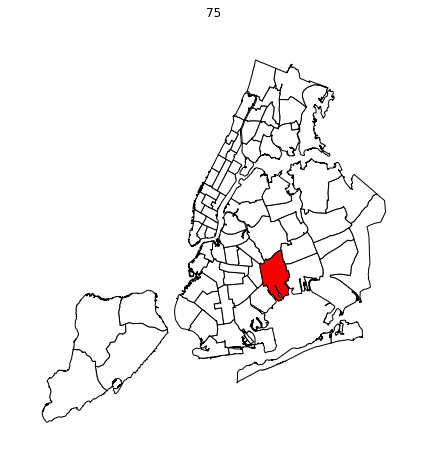

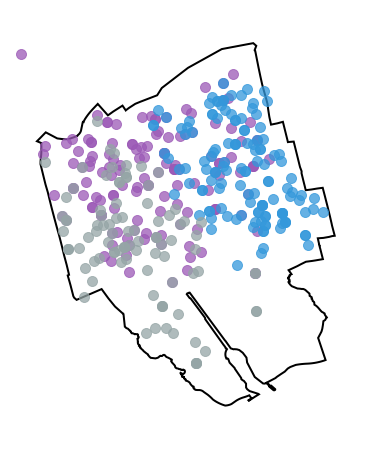

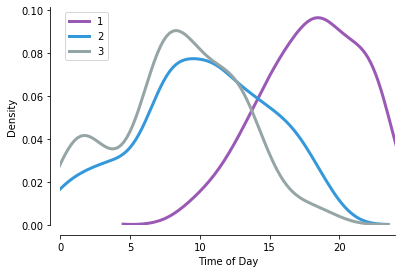

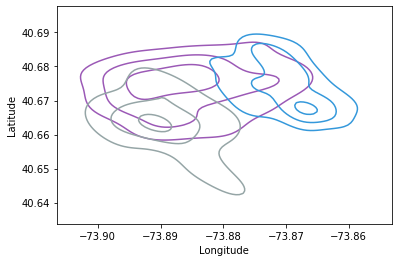

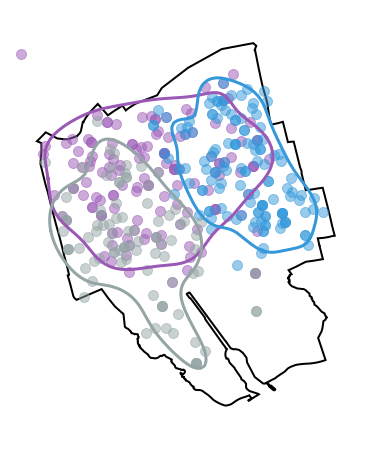

...

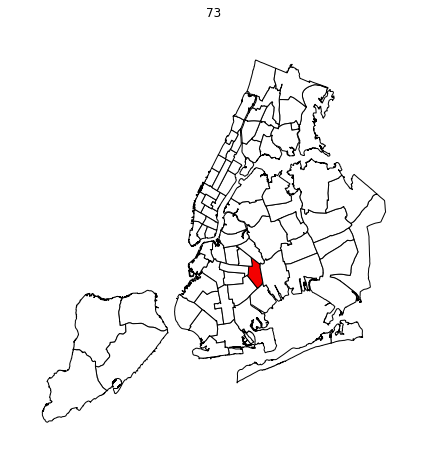

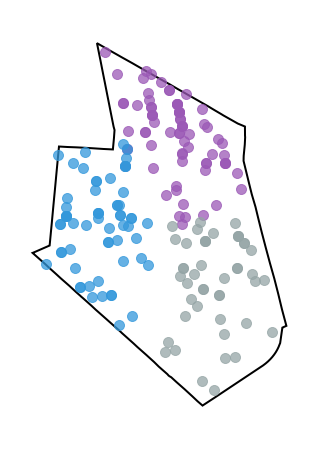

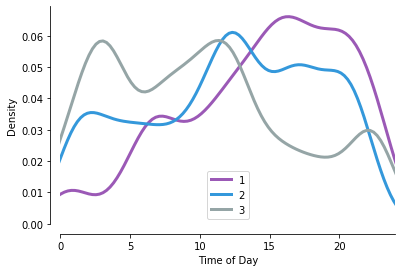

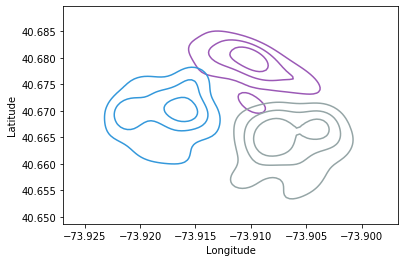

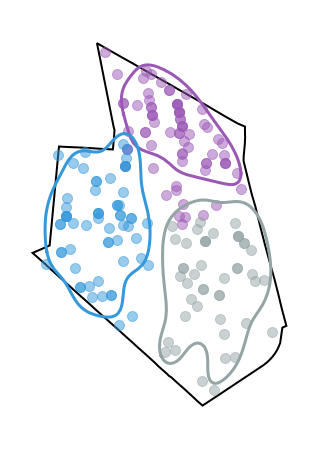

In [421]:
scores = []
for precinct in precincts:
    scores += [main(ds=ds, training_period=training_period, precinct=precinct, n_clusters=n_clusters, testing_period=testing_period, n_levels=n_levels)]

0.6396103896103896


(0, 1)

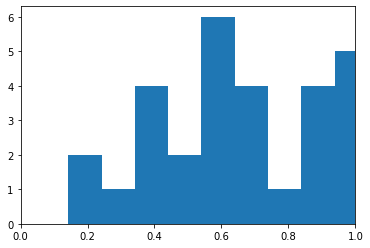

In [416]:
print(np.median(scores))
plt.hist(scores);
plt.xlim(0, 1)

Cluster sizes:
0    140
1    132
2    103
Name: new_labels, dtype: int64
Cluster 0 schedule: 6.266345433154179 18.26634543315418
Cluster 1 schedule: 0.6870892885746986 12.687089288574699
Cluster 2 schedule: 12.902139183595509 0.9021391835955086
Target crimes: 34
Precinct: 75
Events located: 50.0
Cluster sizes:
0    124
1    122
2     91
Name: new_labels, dtype: int64
Cluster 0 schedule: 23.280050930460668 11.28005093046067
Cluster 1 schedule: 5.385061087311357 17.385061087311357
Cluster 2 schedule: 13.400604596736706 1.4006045967367058
Target crimes: 30
Precinct: 83
Events located: 20.0
Cluster sizes:
0    125
1    111
2     82
Name: new_labels, dtype: int64
Cluster 0 schedule: 12.182369930302315 0.18236993030231474
Cluster 1 schedule: 3.3685994626837257 15.368599462683726
Cluster 2 schedule: 22.53072215912912 10.530722159129118
Target crimes: 22
Precinct: 105
Events located: 9.090909090909092
Cluster sizes:
0    114
1    104
2     82
Name: new_labels, dtype: int64
Cluster 0 schedule: 

C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 13
Precinct: 114
Events located: 15.384615384615385
Cluster sizes:
1    91
0    91
2    68
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 0.4773935130010827 12.477393513001083
Cluster 1 schedule: 4.84016676663548 16.84016676663548
Cluster 2 schedule: 14.60256138283414 2.602561382834139


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 11
Precinct: 67
Events located: 54.54545454545454
Cluster sizes:
0    114
1     76
2     56
Name: new_labels, dtype: int64
Cluster 0 schedule: 3.3596320811282823 15.359632081128282
Cluster 1 schedule: 6.075971959380864 18.075971959380865
Cluster 2 schedule: 5.685312891809238 17.68531289180924


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 11
Precinct: 52
Events located: 63.63636363636363
Cluster sizes:
0    123
1    111
2     88
Name: new_labels, dtype: int64
Cluster 0 schedule: 12.656118294297727 0.6561182942977268
Cluster 1 schedule: 3.760512202547819 15.760512202547819
Cluster 2 schedule: 22.723339768736462 10.723339768736462


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 18
Precinct: 47
Events located: 22.22222222222222
Cluster sizes:
0    127
1    104
2     95
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 0 schedule: 5.0860995129156485 17.08609951291565
Cluster 1 schedule: 3.4520412126659767 15.452041212665977
Cluster 2 schedule: 5.714906307751042 17.714906307751043


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 26
Precinct: 104
Events located: 50.0
Cluster sizes:
0    99
1    82
2    80
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 11.246923694318973 23.246923694318973
Cluster 1 schedule: 22.409478032208444 10.409478032208444
Cluster 2 schedule: 4.092900011808741 16.09290001180874


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 19
Precinct: 90
Events located: 73.68421052631578
Cluster sizes:
0    116
1    109
2     99
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 0 schedule: 5.071895344453765 17.071895344453765
Cluster 1 schedule: 12.218880372246758 0.21888037224675827
Cluster 2 schedule: 22.479722867381486 10.479722867381486


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 16
Precinct: 79
Events located: 18.75
Cluster sizes:
0    84
1    81
2    68
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 7.032067039174896 19.032067039174898
Cluster 1 schedule: 12.396791696885519 0.3967916968855185
Cluster 2 schedule: 23.35268130783858 11.352681307838582


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 12
Precinct: 14
Events located: 33.33333333333333
Cluster sizes:
0    105
1    102
2     91
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 0 schedule: 12.316779644395922 0.3167796443959219
Cluster 1 schedule: 3.291970541377939 15.291970541377939
Cluster 2 schedule: 23.976728614388392 11.976728614388392


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 5
Precinct: 43
Events located: 0.0
Cluster sizes:
0    68
1    66
2    49
Name: new_labels, dtype: int64
Cluster 0 schedule: 9.471007521480361 21.47100752148036
Cluster 1 schedule: 3.2040165400938 15.2040165400938
Cluster 2 schedule: 2.49724377020458 14.49724377020458


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 7
Precinct: 113
Events located: 71.42857142857143
Cluster sizes:
0    69
1    63
2    44
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_wa

Cluster 0 schedule: 6.492519859567949 18.49251985956795
Cluster 1 schedule: 10.780699165410567 22.780699165410567
Cluster 2 schedule: 22.360645210410116 10.360645210410116
Target crimes: 12
Precinct: 70
Events located: 50.0
Cluster sizes:
0    103
1     90
2     74
Name: new_labels, dtype: int64
Cluster 0 schedule: 23.387039950387077 11.387039950387077
Cluster 1 schedule: 13.164905680021814 1.164905680021814
Cluster 2 schedule: 9.858352754948086 21.858352754948086


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 19
Precinct: 115
Events located: 26.31578947368421
Cluster sizes:
0    72
1    64
2    51
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 0 schedule: 3.7585254469543194 15.75852544695432
Cluster 1 schedule: 13.227059032390294 1.2270590323902937
Cluster 2 schedule: 0.44006038324320773 12.440060383243207


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 19
Precinct: 61
Events located: 47.368421052631575
Cluster sizes:
0    75
1    48
2    45
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_wa

Cluster 0 schedule: 23.293232582099407 11.293232582099407
Cluster 1 schedule: 12.528695682015957 0.5286956820159574
Cluster 2 schedule: 5.705119165682758 17.70511916568276
Target crimes: 14
Precinct: 66
Events located: 7.142857142857142
Cluster sizes:
0    70
1    58
2    54
Name: new_labels, dtype: int64
Cluster 0 schedule: 8.790720811625 20.790720811625


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 1 schedule: 21.224963204932124 9.224963204932124
Cluster 2 schedule: 11.513991862802449 23.51399186280245
Target crimes: 8
Precinct: 49
Events located: 37.5


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Cluster sizes:
0    88
1    86
2    74
Name: new_labels, dtype: int64
Cluster 0 schedule: 6.494902171886224 18.494902171886224
Cluster 1 schedule: 23.161091988157644 11.161091988157644
Cluster 2 schedule: 12.986905100075987 0.9869051000759868


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 19
Precinct: 110
Events located: 57.89473684210527
Cluster sizes:
0    97
1    67
2    58
Name: new_labels, dtype: int64
Cluster 0 schedule: 6.222423555346218 18.222423555346218


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_wa

Cluster 1 schedule: 22.09734216800258 10.09734216800258
Cluster 2 schedule: 11.638079606746398 23.6380796067464
Target crimes: 16
Precinct: 44
Events located: 56.25
Cluster sizes:
0    78
1    76
2    63
Name: new_labels, dtype: int64
Cluster 0 schedule:

C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


 5.248271139343238 17.248271139343238
Cluster 1 schedule: 22.456245675632182 10.456245675632184
Cluster 2 schedule: 12.302833349384219 0.302833349384219


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, se

Target crimes: 23
Precinct: 106
Events located: 4.3478260869565215
Cluster sizes:
0    57
1    54
2    45
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_wa

Cluster 0 schedule: 9.285240293425527 21.285240293425527
Cluster 1 schedule: 12.016185216667846 0.016185216667846447
Cluster 2 schedule: 21.16805449829867 9.16805449829867


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 17
Precinct: 102
Events located: 17.647058823529413
Cluster sizes:
0    56
1    54
2    53
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_wa

Cluster 0 schedule: 9.811989518173053 21.811989518173053
Cluster 1 schedule: 23.929045480711117 11.929045480711117
Cluster 2 schedule: 11.441197563579642 23.441197563579642
Target crimes: 14
Precinct: 62
Events located: 21.428571428571427
Cluster sizes:
0    91
1    61
2    55
Name: new_labels, dtype: int64
Cluster 0 schedule: 5.288015189769251 17.28801518976925
Cluster 1 schedule: 0.07598875944569361 12.075988759445693
Cluster 2 schedule: 13.430710152788038 1.4307101527880377


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 11
Precinct: 77
Events located: 36.36363636363637
Cluster sizes:
0    64
1    56
2    32
Name: new_labels, dtype: int64
Cluster 0 schedule: 11.069909434714539 23.06990943471454
Cluster 1 schedule: 23.450383610212974 11.450383610212976
Cluster 2 schedule: 2.6295019057282527 14.629501905728253


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 4
Precinct: 120
Events located: 50.0
Cluster sizes:
0    88
1    83
2    70
Name: new_labels, dtype: int64
Cluster 0 schedule: 2.1550308453328864 14.155030845332886
Cluster 1 schedule: 11.75324285602677 23.75324285602677
Cluster 2 schedule: 23.955239992822918 11.955239992822918


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 14
Precinct: 81
Events located: 50.0
Cluster sizes:
1    69
0    69
2    67
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 7.160205737194687 19.160205737194687
Cluster 1 schedule: 11.539487271323615 23.539487271323615
Cluster 2 schedule: 23.258102226953785 11.258102226953785


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 24
Precinct: 19
Events located: 41.66666666666667
Cluster sizes:
0    91
1    63
2    48
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_wa

Cluster 0 schedule: 2.9461302410370074 14.946130241037007
Cluster 1 schedule: 13.179010590509641 1.179010590509641
Cluster 2 schedule: 1.7515616512589949 13.751561651258996
Target crimes: 10
Precinct: 103
Events located: 30.0
Cluster sizes:
0    67
1    59
2    56
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4.868419144331783 16.86841914433178
Cluster 1 schedule: 11.765471861970006 23.765471861970006
Cluster 2 schedule: 21.657435568446267 9.657435568446267


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 14
Precinct: 73
Events located: 42.857142857142854


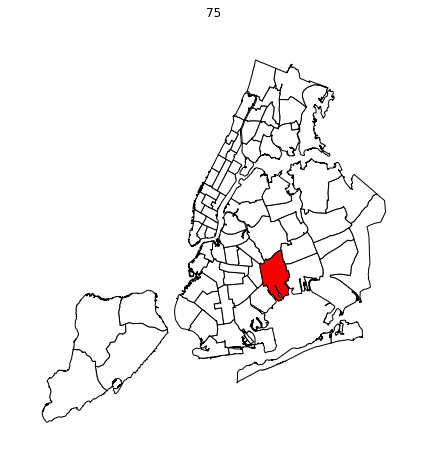

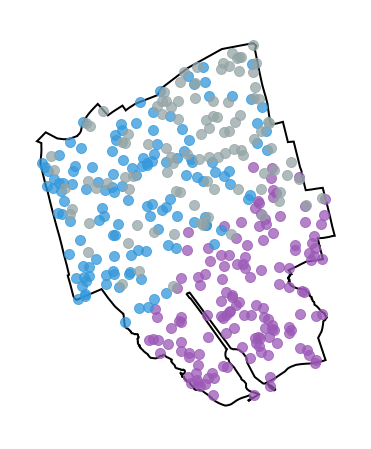

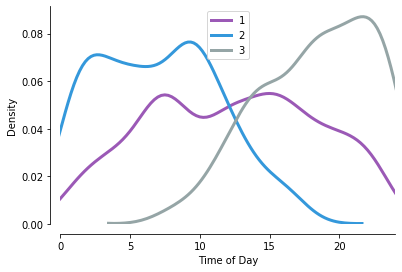

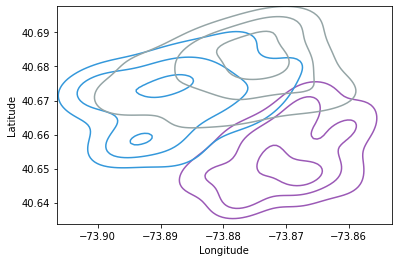

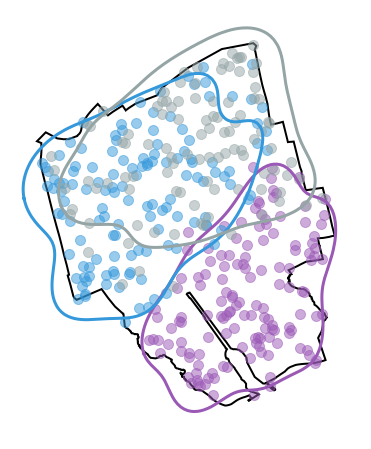

...

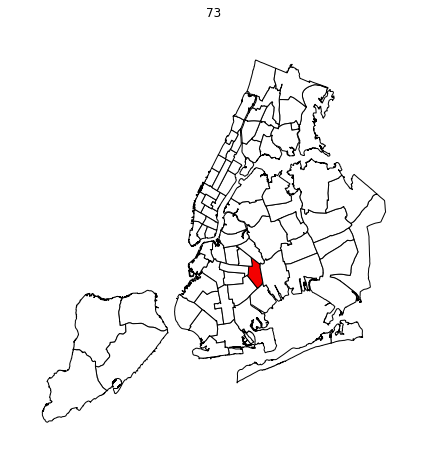

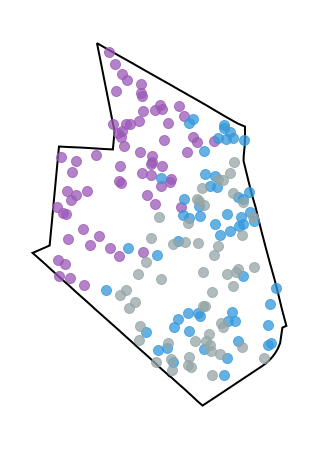

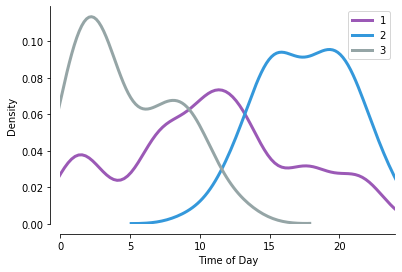

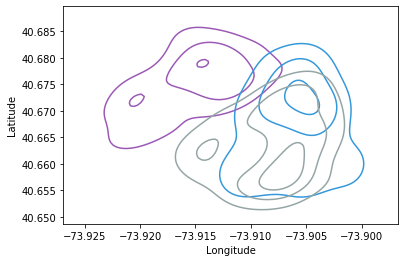

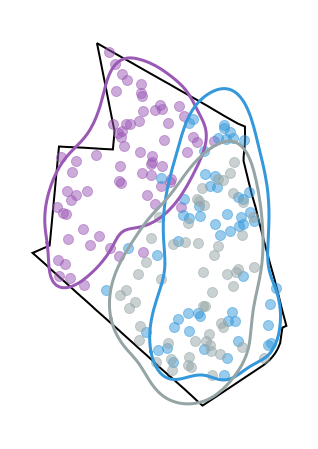

In [413]:
random_scores = []
for precinct in precincts:
    random_scores += [random_main(ds=ds, training_period=training_period, precinct=precinct, n_clusters=n_clusters, testing_period=testing_period, n_levels=n_levels)]

0.39583333333333337


(0, 1)

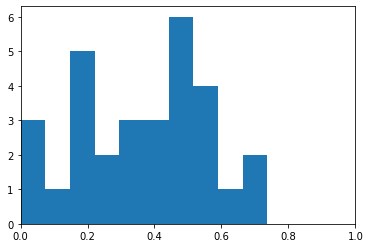

In [415]:
print(np.median(random_scores))
plt.hist(random_scores);
plt.xlim(0, 1)